In [1]:
import sys
from pathlib import Path

p = Path.cwd()
while p != p.parent and not (p / "src").exists():
    p = p.parent

REPO = p
SRC = REPO / "src"
sys.path.insert(0, str(SRC))

print("Using REPO:", REPO)
print("SRC exists:", SRC.exists(), SRC)

%load_ext autoreload
%autoreload 2


Using REPO: /Users/oliwiaw/PycharmProjects/WMUM
SRC exists: True /Users/oliwiaw/PycharmProjects/WMUM/src


In [2]:
from pathlib import Path
import eval_models

print("ROOT:", eval_models.ROOT)
print("RUNS:", eval_models.RUNS)
print("OUT:", eval_models.OUT)
print("DATA_YOLO:", eval_models.DATA_YOLO)
print("DATA_COCO:", eval_models.DATA_COCO)

# sprawdź czy OUT istnieje (utworzy się też przy zapisie)
eval_models.ensure_dir(Path(eval_models.OUT))


ROOT: /Users/oliwiaw/PycharmProjects/WMUM
RUNS: /Users/oliwiaw/PycharmProjects/WMUM/runs
OUT: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis
DATA_YOLO: /Users/oliwiaw/PycharmProjects/WMUM/data/processed/yolov8
DATA_COCO: /Users/oliwiaw/PycharmProjects/WMUM/data/processed/coco


In [3]:
from dataclasses import asdict
import pandas as pd

datasets = ["cats_dogs", "traffic_signs", "vehicles"]
rows = []

for ds in datasets:
    # 1) wspólne obrazki z YOLO valid/images (raz)
    shared_dir = eval_models.yolo_valid_images_dir(ds)
    shared_imgs = eval_models.pick_images(shared_dir, k=12, seed=0)

    print(ds, "shared_dir =", shared_dir)
    print("n shared:", len(shared_imgs))

    # 2) YOLO: różne kolory dla 8n i 8s
    r = eval_models.eval_yolo(ds, "yolov8n", conf=0.25, seed=0, color="red", topk=3, image_paths=shared_imgs)
    rows.append(asdict(r))
    print("OK", r)

    r = eval_models.eval_yolo(ds, "yolov8s", conf=0.25, seed=0, color="orange", topk=3, image_paths=shared_imgs)
    rows.append(asdict(r))
    print("OK", r)

    # 3) Torchvision: na tych samych PLIKACH co YOLO (NOWA funkcja)
    r = eval_models.eval_torchvision_on_images(ds, "fasterrcnn", shared_imgs, score_thr=0.5, device="cpu", color="blue", topk=3)
    rows.append(asdict(r))
    print("OK", r)

    r = eval_models.eval_torchvision_on_images(ds, "retinanet", shared_imgs, score_thr=0.5, device="cpu", color="green", topk=3)
    rows.append(asdict(r))
    print("OK", r)

df = pd.DataFrame(rows)
df


cats_dogs shared_dir = /Users/oliwiaw/PycharmProjects/WMUM/data/processed/yolov8/cats_dogs/valid/images
n shared: 12
OK EvalRow(framework='ultralytics', dataset='cats_dogs', model='yolov8n', n_images=12, score_thr=0.25, topk=3, avg_dets_per_img=1.1666666666666667, avg_score=0.7174987537520272, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8n')
OK EvalRow(framework='ultralytics', dataset='cats_dogs', model='yolov8s', n_images=12, score_thr=0.25, topk=3, avg_dets_per_img=1.0, avg_score=0.7336976627508799, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8s')
OK EvalRow(framework='torchvision', dataset='cats_dogs', model='fasterrcnn', n_images=12, score_thr=0.5, topk=3, avg_dets_per_img=1.25, avg_score=0.6691763639450073, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__fasterrcnn')
OK EvalRow(framework='torchvision', dataset='cats_dogs', model='retinanet', n_images=12, score_th

,framework,dataset,model,n_images,score_thr,topk,avg_dets_per_img,avg_score,out_dir
0,ultralytics,cats_dogs,yolov8n,12,0.25,3,1.166667,0.717499,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
1,ultralytics,cats_dogs,yolov8s,12,0.25,3,1.000000,0.733698,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
2,torchvision,cats_dogs,fasterrcnn,12,0.50,3,1.250000,0.669176,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
3,torchvision,cats_dogs,retinanet,12,0.50,3,0.333333,0.634406,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
4,ultralytics,traffic_signs,yolov8n,12,0.25,3,1.500000,0.539510,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
5,ultralytics,traffic_signs,yolov8s,12,0.25,3,0.833333,0.481725,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
6,torchvision,traffic_signs,fasterrcnn,12,0.50,3,0.166667,0.706823,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
7,torchvision,traffic_signs,retinanet,12,0.50,3,0.000000,0.000000,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
8,ultralytics,vehicles,yolov8n,12,0.25,3,3.000000,0.828811,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...
9,ultralytics,vehicles,yolov8s,12,0.25,3,3.000000,0.857644,/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_...


In [4]:
eval_models.write_csv(rows, Path(eval_models.OUT) / "quick_eval_all.csv")
print("Saved:", Path(eval_models.OUT) / "quick_eval_all.csv")

Saved: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/quick_eval_all.csv


In [5]:
from pathlib import Path
import eval_models

base = Path(eval_models.OUT)

checks = [
    ("YOLOv8n", base / "ultralytics" / "cats_dogs__yolov8n"),
    ("YOLOv8s", base / "ultralytics" / "traffic_signs__yolov8s"),
    ("FasterRCNN", base / "torchvision" / "vehicles__fasterrcnn"),
    ("RetinaNet", base / "torchvision" / "cats_dogs__retinanet"),
]

for name, d in checks:
    n = len(list(d.glob("*__pred.jpg"))) if d.exists() else 0
    print(f"{name:10s} exists={d.exists()}  n_pred={n}  dir={d}")


YOLOv8n    exists=True  n_pred=12  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8n
YOLOv8s    exists=True  n_pred=12  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/traffic_signs__yolov8s
FasterRCNN exists=True  n_pred=24  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/vehicles__fasterrcnn
RetinaNet  exists=True  n_pred=24  dir=/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__retinanet


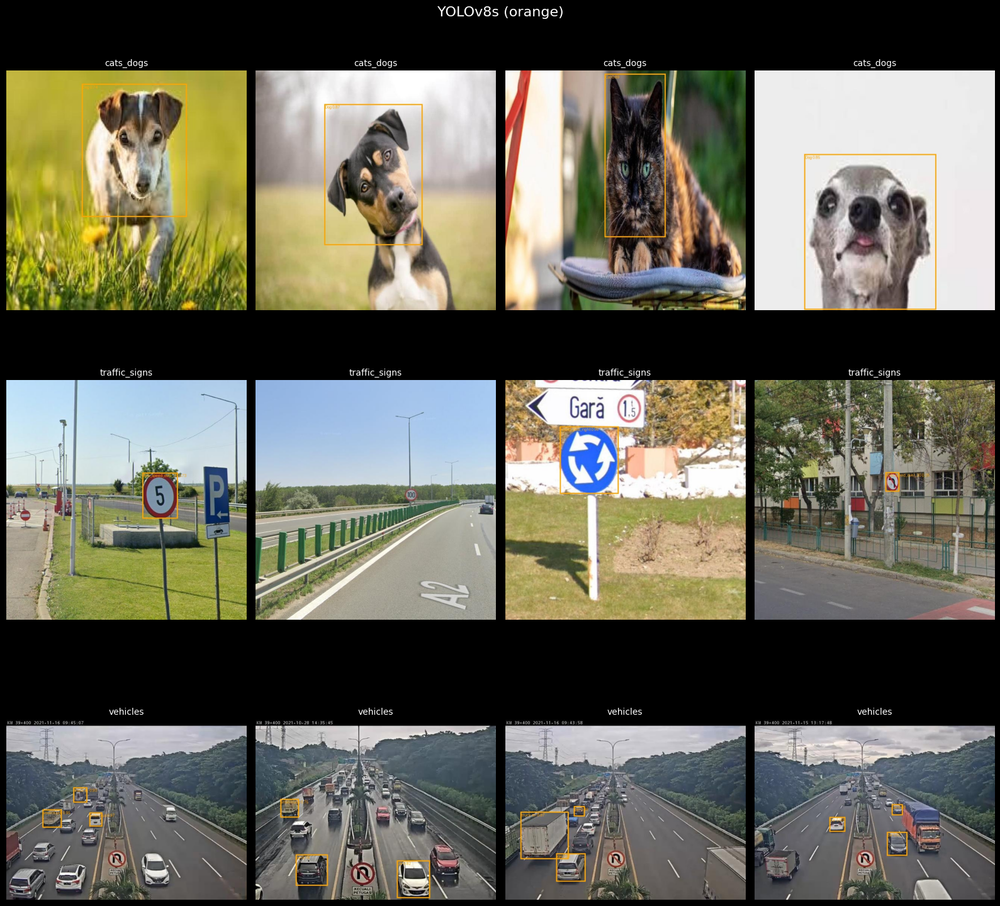

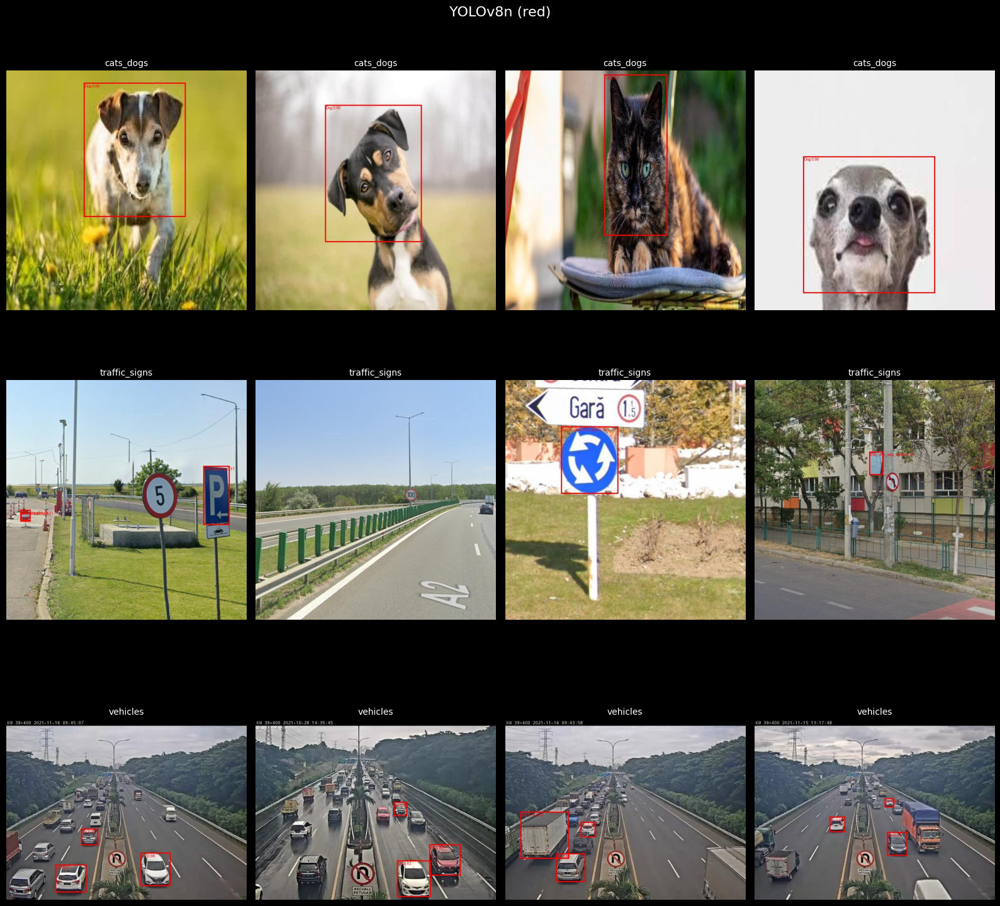

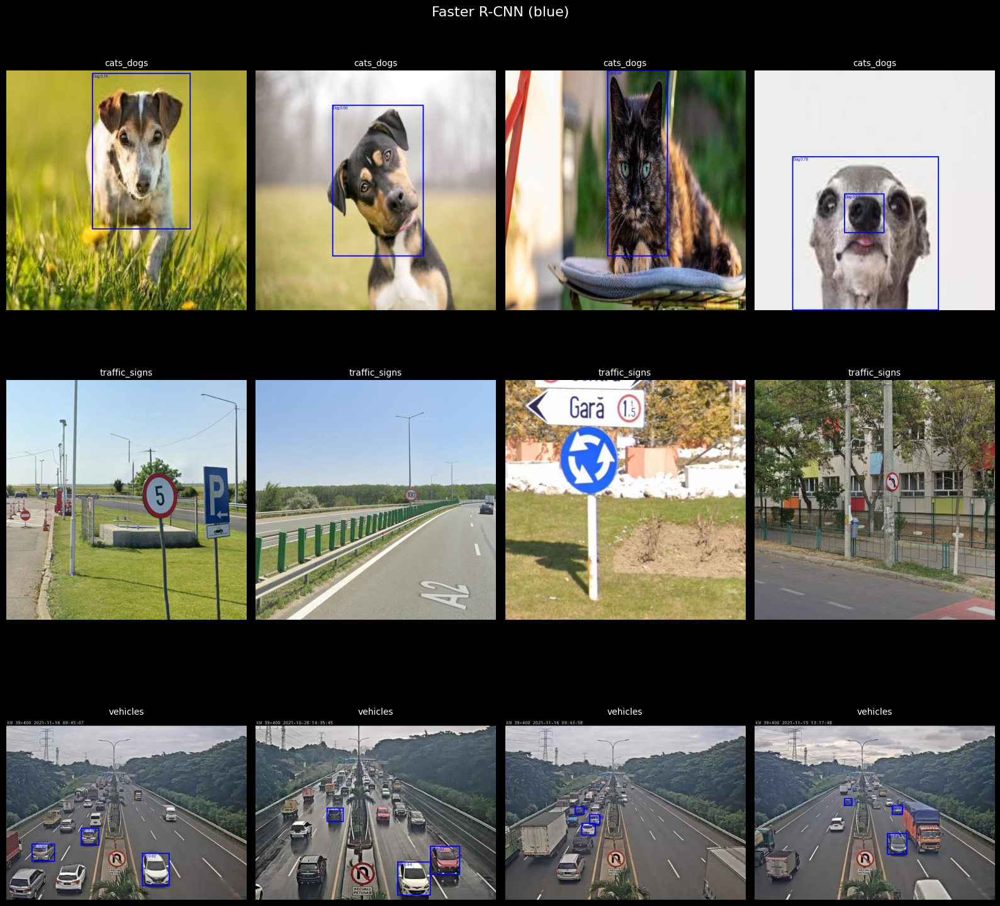

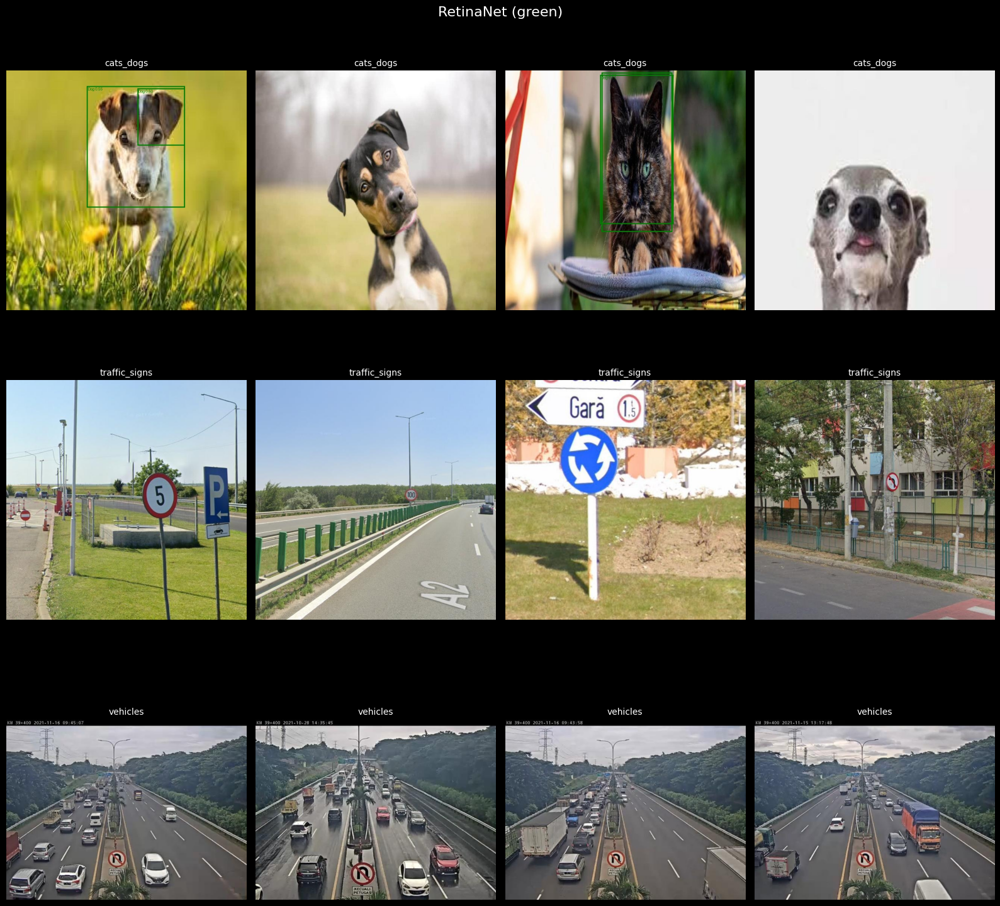

In [6]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import eval_models as evalmodels
from pathlib import Path


base = Path(eval_models.OUT)


plan = [("cats_dogs", 4), ("traffic_signs", 4), ("vehicles", 4)]

def pick_stems(ds: str, k: int = 4, seed: int = 0):
    img_dir = evalmodels.yolo_valid_images_dir(ds)
    imgs = evalmodels.pick_images(img_dir, k=k, seed=seed)
    return [p.stem for p in imgs]


items = []
for ds, k in plan:
    stems = pick_stems(ds, k=k, seed=0)
    items.extend([(ds, s) for s in stems])

models = [
    ("YOLOv8s (orange)",     base / "ultralytics", "yolov8s"),
    ("YOLOv8n (red)",        base / "ultralytics", "yolov8n"),
    ("Faster R-CNN (blue)",  base / "torchvision", "fasterrcnn"),
    ("RetinaNet (green)",    base / "torchvision", "retinanet"),
]

def show_grid(title, root, model, nrows=3, ncols=4):
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 16))
    fig.suptitle(title, fontsize=16)
    axes = axes.flatten()

    for i, (ds, stem) in enumerate(items):
        ax = axes[i]
        p = root / f"{ds}__{model}" / f"{stem}__pred.jpg"

        if not p.exists():
            ax.set_title(f"{ds}\nMISSING", fontsize=9)
            ax.axis("off")
            continue

        img = Image.open(p).convert("RGB")
        ax.imshow(np.array(img))
        ax.set_title(ds, fontsize=10)
        ax.axis("off")

    # gdyby było mniej niż 16 (np. brak obrazków w folderze), wyłącz resztę pól
    for j in range(len(items), nrows * ncols):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

for title, root, model in models:
    show_grid(title, root, model)
